In [1]:
import helper
import plotting

import warnings
warnings.filterwarnings("ignore")

In [2]:
PATH = ["F:/cellpose/code_demo/"]
MOD_DIR = "F:/cellpose/code_demo/train/models/"

## Predict masks for dataset

In [3]:
all_results = helper.prediction.batch_predict(MOD_DIR,PATH,mute=True,configuration=[[],{'diameter':10}],return_results=True)

FH_boosted found...


F:/cellpose/code_demo//train/: 100%|██████████| 6/6 [01:03<00:00, 10.56s/image]


cellpose_residual_on_style_on_concatenation_off_train_2022_10_13_11_18_34 found...


F:/cellpose/code_demo//train/: 100%|██████████| 6/6 [00:38<00:00,  6.40s/image]


### Inspect segmentation in images

In [4]:
#set paths
imgs,lbls,preds = helper.eval.dataset_loader(PATH, label_str='mask',pred_str='boosted_pred')

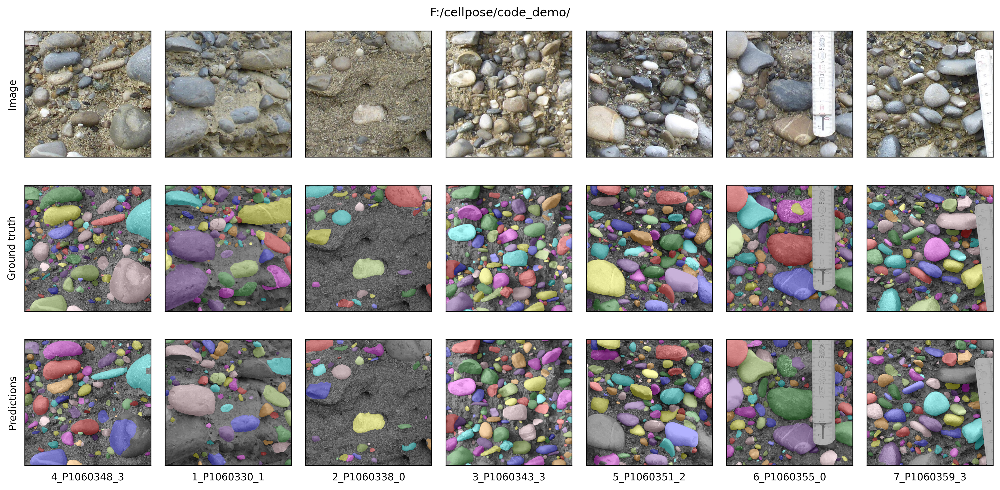

In [5]:
fig = plotting.segmentation.inspect_predictions(imgs,lbls,preds,PATH=PATH[0])

## Evaluate segmentation performance

In [6]:
#set paths
imgs,lbls,preds = helper.eval.dataset_loader(PATH, label_str='mask',pred_str='boosted_pred')
#eval mAP @ IoU
eval_results = helper.eval.eval_set(imgs,lbls,preds,dataID='FH_boosted')

### Plot segmentation performance

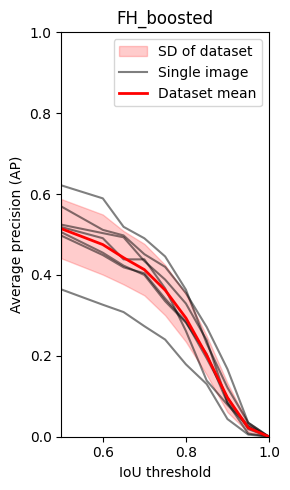

In [7]:
fig1 = plotting.segmentation.AP_IoU_plot(eval_results,title='FH_boosted')

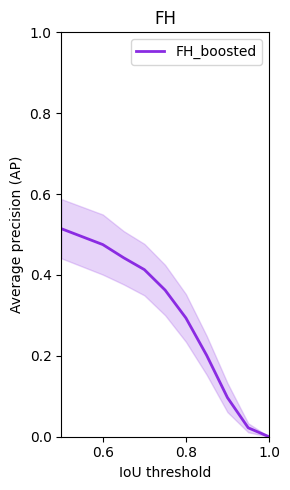

In [8]:
elem = {
    'dataset':'FH',
    'model_ID':['FH_boosted'],
    'colors':['blueviolet','m','mediumblue'],
    'images':False,
    'SD':True,
    'avg_model':True
    }
fig2= plotting.segmentation.AP_IoU_summary_plot([eval_results],elem)